In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import os
import sys
import anndata
import scvi

import matplotlib.pyplot as plt
import matplotlib as mpl

In [2]:
def MovePlots(plotpattern, subplotdir):
    os.system('mkdir -p '+str(sc.settings.figdir)+'/'+subplotdir)
    os.system('mv '+str(sc.settings.figdir)+'/*'+plotpattern+'** '+str(sc.settings.figdir)+'/'+subplotdir)

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.figdir = '../results/images/integrated/SoC_maternalFoetal/'
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

sys.executable

-----
anndata     0.7.5
scanpy      1.7.1
sinfo       0.3.1
-----
PIL                 8.1.2
absl                NA
anndata             0.7.5
anyio               NA
attr                20.3.0
babel               2.9.0
backcall            0.2.0
brotli              NA
cairo               1.20.0
certifi             2020.12.05
cffi                1.14.5
chardet             4.0.0
cloudpickle         1.6.0
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
cytoolz             0.11.0
dask                2021.03.1
dateutil            2.8.1
decorator           4.4.2
fsspec              0.8.7
get_version         2.1
google              NA
h5py                3.1.0
idna                2.10
igraph              0.8.3
ipykernel           5.5.0
ipython_genutils    0.2.0
ipywidgets          7.6.3
jedi                0.18.0
jinja2              2.11.3
joblib              1.0.1
json5               NA
jsonschema          3.2.0
jupyter_server      1.4.1
jupyterlab_server   2.3.0
kiw

'/opt/conda/bin/python'

In [3]:
def identityTransfer(adata_CellsNewID, adata, field='identity'):
    
    '''
    Function to transfer the value in a .obs column, modifying only the cells included in adata_CellsNewID
    
    Parameters:
        adata_CellsNewID: anndata object with cells. These should have in their .obs[field] the new values to be transfer to adata
        adata: anndata object to modify. The value in .obs[field] will be modifies for all the cells in adata_CellsNewID
        field: column name in .obs to operate in
        
    '''
    
    #converting categorical into strings to introduce new categories
    adata.obs[field]=adata.obs[field].astype("string")


    #assigning the new categories to the cells in adata
    for cell in adata_CellsNewID.obs.index:
        adata.obs[field][cell] = adata_CellsNewID.obs[field][cell]

    #Returning strings into categorical 
    adata.obs[field]=adata.obs[field].astype("category")
    
    return(adata)

In [4]:
#Function to add the souporcell id

def add_souporcell_id(adata_obj, cell_id):
    '''
    Function to add the souporcell status (e.g. 0,1, not pooled, etc.) to the cells
    
    Input
        adata_obj: adata object
        cell_id: id of a cell
    
    '''
    
    curr_sample = adata_obj.obs.loc[cell_id, 'sample']
    
    #print('sample',sample, 'barcode', cell_id)
    
    if curr_sample in samples:
        #print(curr_sample)
        #extracts the table contained in the indicated key of the dictionary
        curr_souporcell_table = souporcell_clusters[curr_sample]
        
        if (cell_id in list(curr_souporcell_table.index)): #checking that the cells are into the data
            curr_assign = souporcell_clusters[curr_sample].loc[cell_id,'assignment']
            #print('returning',curr_assign)
            return(curr_assign)

        else:
            # cell barcode is filtered by souporcell
            return('filtered_by_souporcell')
    else:
        return('not_available')

## ---------


### dMs only

In [ ]:
adata= sc.read('../results/scVI/S2_scVIintegrated_adata_latent30_cleanV3.h5ad')

In [221]:
sc.settings.figdir = '../results/images/integrated/clean/'

In [222]:
#Selecting the cells in the desired clusters
temp_cells = adata[adata.obs['identity'] == 'dM1']
temp_cells2= adata[adata.obs['identity'] == 'dM2']
temp_cells3= adata[adata.obs['identity'] == 'M3']

temp_cells = temp_cells.concatenate(temp_cells2,temp_cells3, index_unique=None)

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [223]:
#Selecting the cells in the desired clusters
temp_cells2= adata[adata.obs['identity'] == 'MO']
temp_cells3= adata[adata.obs['identity'] == 'HBs']

temp_cells = temp_cells.concatenate(temp_cells2,temp_cells3, index_unique=None)

In [224]:
del(temp_cells2)
del(temp_cells3)

In [225]:
#LATENT 30
sc.pp.neighbors(temp_cells, n_neighbors=25, use_rep="X_scVI_n_latent_30")
sc.tl.umap(temp_cells)

#clustering
sc.tl.leiden(temp_cells, key_added="leiden_scvi", resolution=0.3)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:06)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:20)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:07)


In [ ]:
#clustering
sc.pl.umap(temp_cells, color=["leiden_scvi",'pcw','day'],  save='_scVI_latent30_cleanV3_Macrophages1.pdf')
sc.pl.umap(temp_cells, color=['souporcell_MFidentity','identity','donor_souporcell'],save='_scVI_latent30_cleanV3_Macrophages2.pdf')


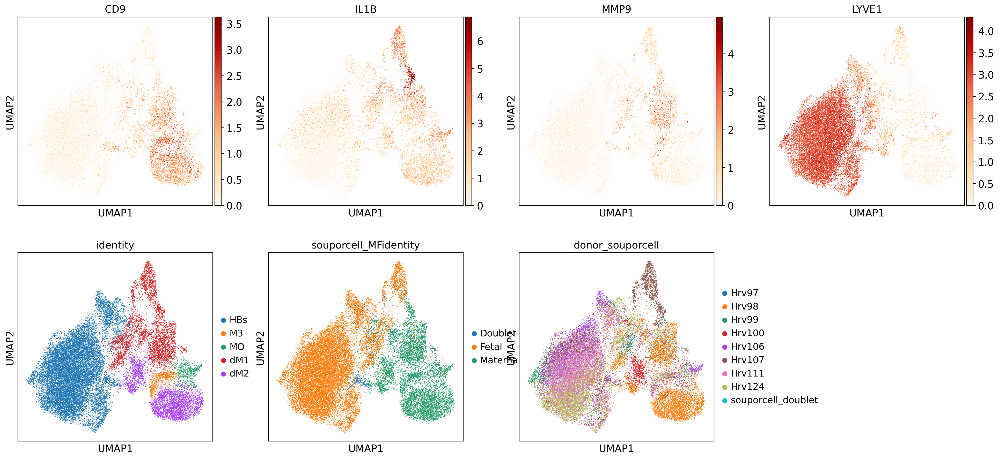

In [227]:
sc.pl.umap(temp_cells, color=['CD9', 'IL1B', 'MMP9','LYVE1',
                         'identity','souporcell_MFidentity','donor_souporcell'],color_map='OrRd', save='_scVI_latent30_cleanV3_Macrophages_markersM3.pdf')

In [ ]:
sc.pl.umap(temp_cells, color=['S100A9', 'SELL', 'S100A8','S100A12','IFITM2','LST1',
            'identity','souporcell_MFidentity','donor_souporcell'],color_map='OrRd',
            save='_scVI_latent30_cleanV3_Macrophages_markersPAMM1b.pdf')

In [ ]:
sc.pl.umap(temp_cells, color=['HLA-DRB1', 'FCGR3A', 'OLR1','RGS1','CD63','CD68',
                              'APOE','GPNMB',
            'identity','souporcell_MFidentity','donor_souporcell'],color_map='OrRd',
            save='_scVI_latent30_cleanV3_Macrophages_markersPAMM1a.pdf')

In [ ]:
#COpying the value of the leiden cluster. The new column will help to change it's values for
# the cluster identity
dM1.obs['identity']= dM1.obs['leiden_scvi']


#Function that changes the cluster names as indicated
dM1.obs['identity'] = (dM1.obs["leiden_scvi"].map(lambda x: 
                            { "0": "M3_b", "1": "HBs", "2": "HBs", "3": "dM1", "4": "dM1"}
                            .get(x, x)).astype("category"))

In [ ]:
adata= identityTransfer(dM1, adata)

### Macrophages re-annotation
Some mistakes are visible with the SoC deconvolution. Here I will ammend them.

In [200]:
dM1 = temp_cells[temp_cells.obs['identity'] == 'dM1']

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


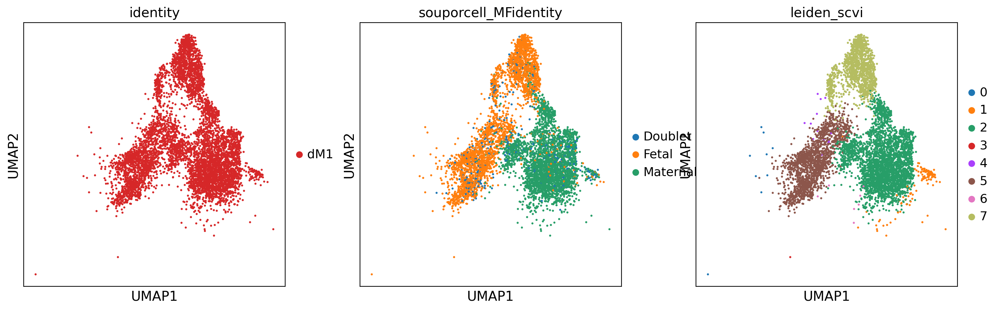

In [201]:
sc.pl.umap(dM1, color=['identity','souporcell_MFidentity','leiden_scvi'],color_map='OrRd')

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)
running Leiden clustering
    finished: found 5 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:00)


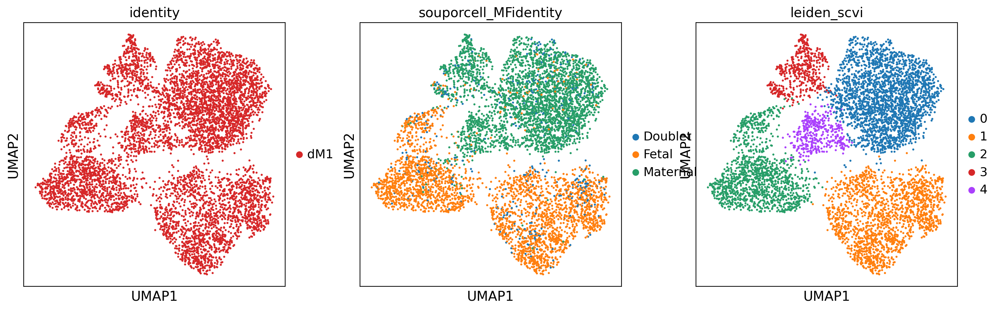

In [202]:
#LATENT 30
sc.pp.neighbors(dM1, n_neighbors=25, use_rep="X_scVI_n_latent_30")
sc.tl.umap(dM1)

#clustering
sc.tl.leiden(dM1, key_added="leiden_scvi", resolution=0.3)

sc.pl.umap(dM1, color=['identity','souporcell_MFidentity','leiden_scvi'],color_map='OrRd')

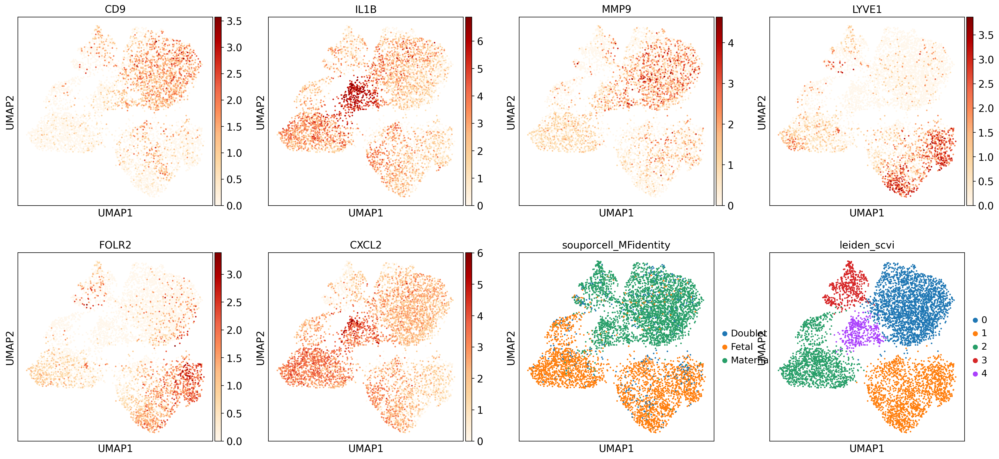

In [203]:
sc.pl.umap(dM1, color=['CD9', 'IL1B', 'MMP9','LYVE1','FOLR2','CXCL2',
                         'souporcell_MFidentity','leiden_scvi'], color_map='OrRd')

In [ ]:
sc.pl.umap(dM1, color=['day',
                         'souporcell_MFidentity','leiden_scvi'], color_map='OrRd')

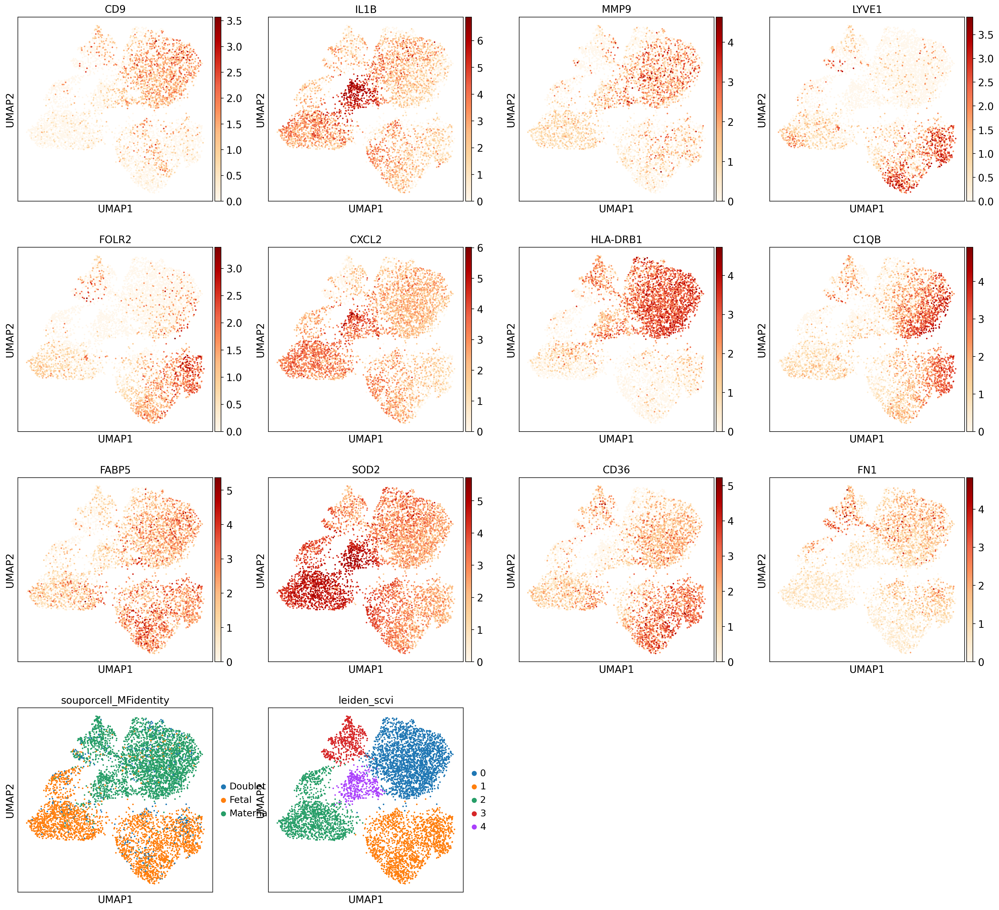

In [216]:
sc.pl.umap(dM1, color=['CD9', 'IL1B', 'MMP9','LYVE1','FOLR2','CXCL2',
                       'HLA-DRB1','C1QB','FABP5','SOD2','CD36','FN1',
                         'souporcell_MFidentity','leiden_scvi'], color_map='OrRd')

In [208]:
#COpying the value of the leiden cluster. The new column will help to change it's values for
# the cluster identity
dM1.obs['identity']= dM1.obs['leiden_scvi']


#Function that changes the cluster names as indicated
dM1.obs['identity'] = (dM1.obs["leiden_scvi"].map(lambda x: 
                            { "0": "M3_b", "1": "HBs", "2": "HBs", "3": "dM1", "4": "dM1"}
                            .get(x, x)).astype("category"))

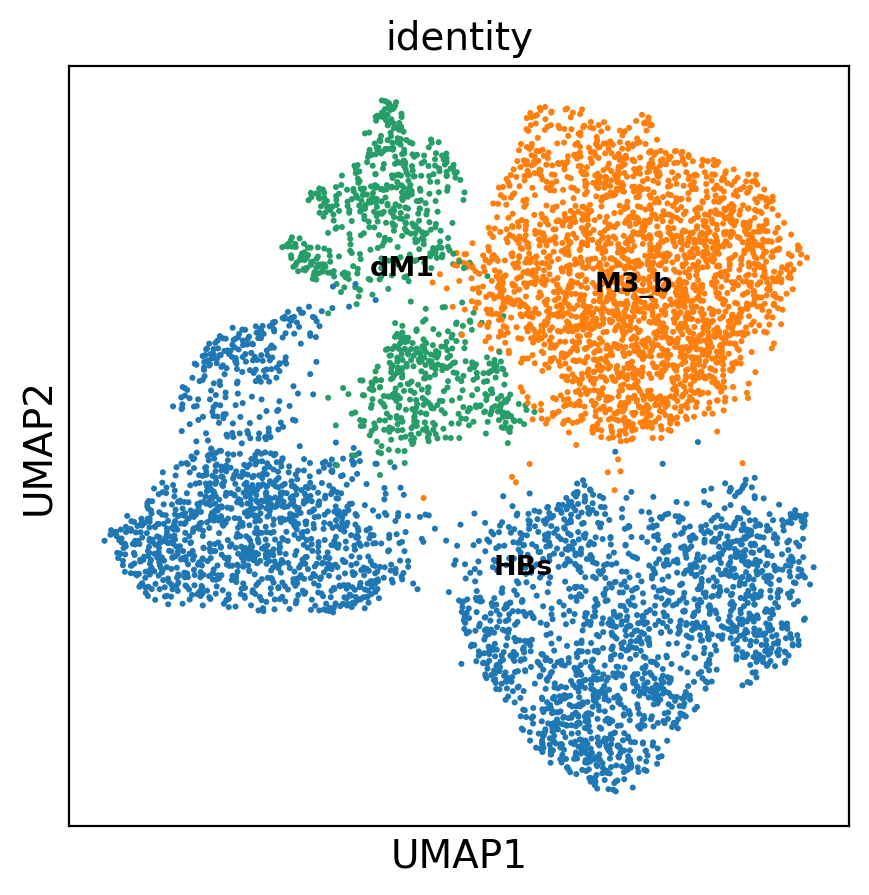

In [209]:
# use scVI imputed values for plottin
sc.pl.umap(dM1, color=['identity' ], legend_loc='on data',legend_fontsize='x-small')

In [210]:
adata= identityTransfer(dM1, adata)

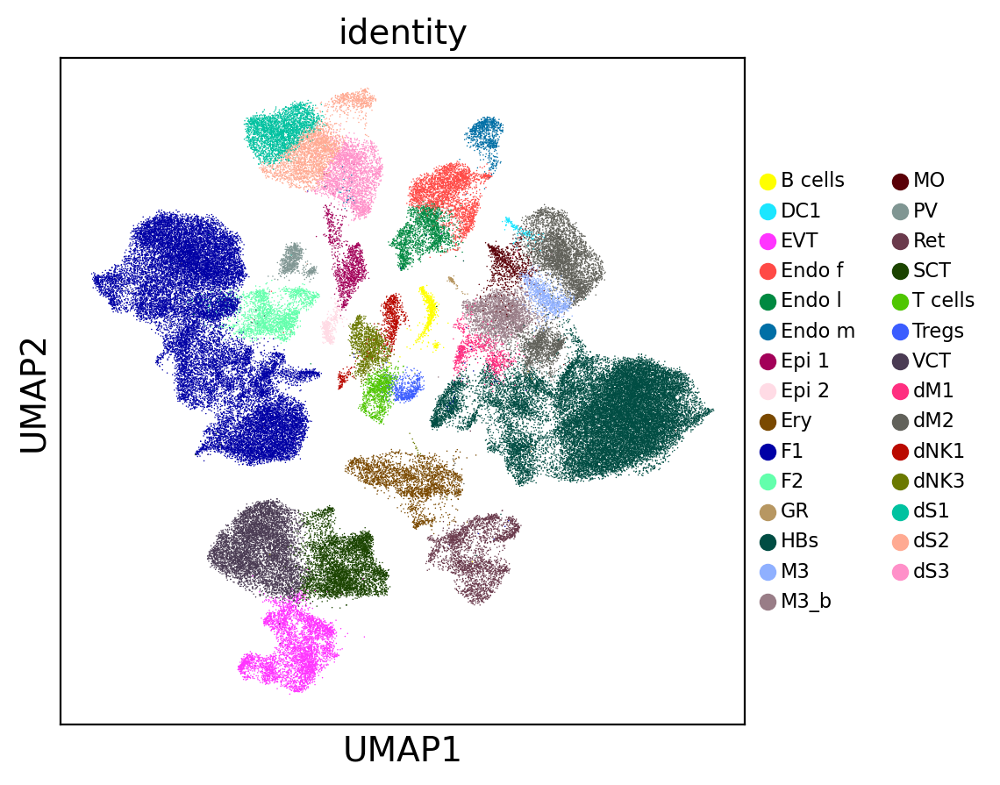

In [211]:
# use scVI imputed values for plottin
sc.pl.umap(adata, color=['identity' ],legend_fontsize='xx-small',
           save='_scVI_latent30_cleanV3.pdf')

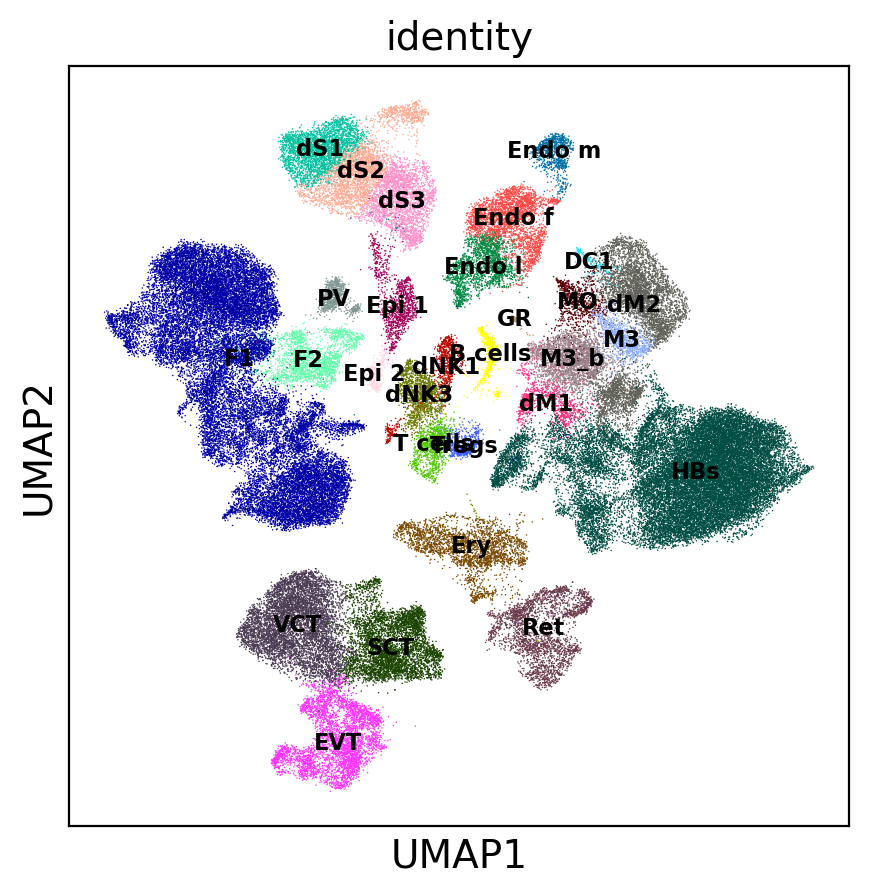

In [217]:
# use scVI imputed values for plottin
sc.pl.umap(adata, color=['identity' ],legend_fontsize='xx-small',legend_loc= 'on data',
           save='_scVI_latent30_cleanV3_ondata.pdf')

In [97]:
del(dM1)
del(temp_cells)

In [ ]:
adata.write('../results/scVI/S2_scVIintegrated_adata_latent30_cleanV3.h5ad')